# Chapter 3: More Image Manipulation

## More Image Manipulation with PIL

In [78]:
from PIL import Image, ImageFilter, ImageOps
import numpy as np
import matplotlib.pylab as plt
import os
import warnings
warnings.filterwarnings('ignore')

### Changing image quality / resolution of a JPEG image

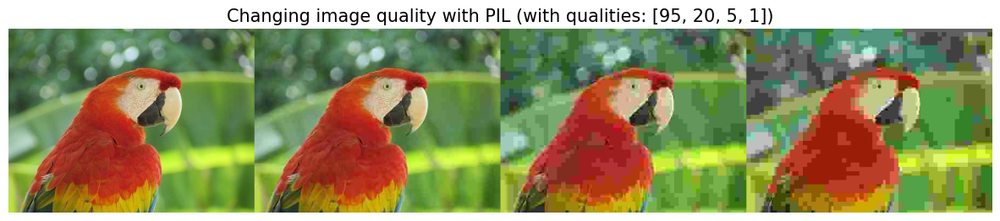

In [30]:
im = Image.open('images/parrot.jpg')
qualities = [95, 20, 5, 1]
for quality in qualities:
    im.save(f"images/parrot_{quality}.jpg", quality=quality)

plt.figure(figsize=(15,6))
plt.imshow(np.hstack([Image.open(f"images/parrot_{quality}.jpg") for quality in qualities])), plt.axis('off')
plt.title('Changing image quality with PIL (with qualities: {})'.format(qualities), size=15)
plt.show()

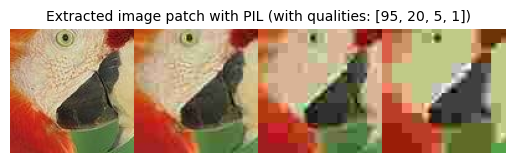

In [31]:
plt.imshow(np.hstack([np.array(Image.open(f"images/parrot_{quality}.jpg"))[100:200, 200:300] for quality in qualities])), plt.axis('off')
plt.title('Extracted image patch with PIL (with qualities: {})'.format(qualities), size=10);

In [ ]:
original_size = os.path.getsize("images/parrot.jpg")
for quality in qualities:
    compressed_size = os.path.getsize(f"images/parrot_{quality}.jpg")
    print(f"Quality {quality}: Compression Ratio = {original_size / compressed_size:.2f}")
# Quality 95: Compression Ratio = 0.53
# Quality 20: Compression Ratio = 2.95
# Quality 5: Compression Ratio = 5.33
# Quality 1: Compression Ratio = 6.14

### Changing image quality / resolution of a PNG image

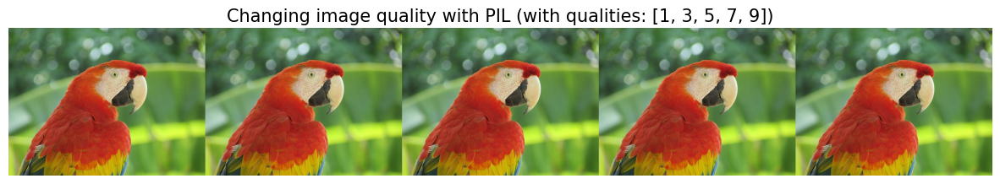

In [35]:
im = Image.open('images/parrot.png')
compress_levels = list(range(1,10,2))
for compress_level in compress_levels:
    im.save(f"images/parrot_{compress_level}.png", compress_level=compress_level)

plt.figure(figsize=(15,6))
plt.imshow(np.hstack([Image.open(f"images/parrot_{compress_level}.png") for compress_level in compress_levels])), plt.axis('off')
plt.title('Changing image quality with PIL (with qualities: {})'.format(compression_ratios), size=15)
plt.show()

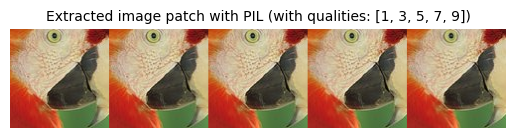

In [36]:
plt.imshow(np.hstack([np.array(Image.open(f"images/parrot_{compress_level}.png"))[100:200, 200:300] for compress_level in compress_levels])), plt.axis('off')
plt.title('Extracted image patch with PIL (with qualities: {})'.format(compress_levels), size=10);

In [37]:
original_size = os.path.getsize("images/parrot.png")
for compress_level in compress_levels:
    compressed_size = os.path.getsize(f"images/parrot_{compress_level}.png")
    print(f"Quality {compress_level}: Compression Ratio = {original_size / compressed_size:.2f}")

Quality 1: Compression Ratio = 1.50
Quality 3: Compression Ratio = 1.57
Quality 5: Compression Ratio = 1.70
Quality 7: Compression Ratio = 1.72
Quality 9: Compression Ratio = 1.75


### Deforming an Image

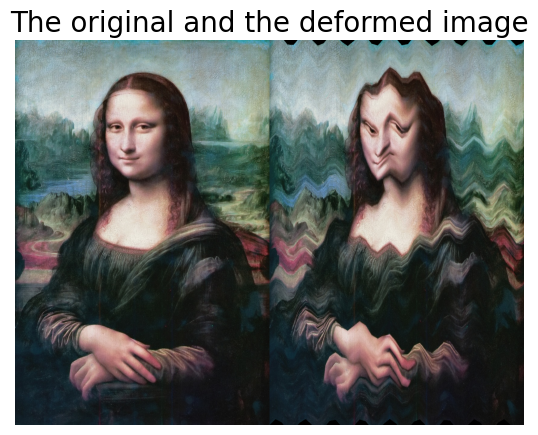

In [84]:
# https://pythoninformer.com/python-libraries/pillow/imageops-deforming/

class WaveDeformer:

    def transform(self, x, y):
        y = y + 20*np.sin(x/15)
        return x, y

    def transform_rectangle(self, x0, y0, x1, y1):
        return (*self.transform(x0, y0),
                *self.transform(x0, y1),
                *self.transform(x1, y1),
                *self.transform(x1, y0),
                )

    def getmesh(self, img):
        self.w, self.h = img.size
        gridspace = 20
        target_grid = []
        for x in range(0, self.w, gridspace):
            for y in range(0, self.h, gridspace):
                target_grid.append((x, y, x + gridspace, y + gridspace))
        source_grid = [self.transform_rectangle(*rect) for rect in target_grid]
        return [t for t in zip(target_grid, source_grid)]
    

im = Image.open('images/monalisa.jpg')
im_deformed = ImageOps.deform(im, WaveDeformer())
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((np.array(im), np.array(im_deformed)))), plt.axis('off')
plt.title('The original and the deformed image', size=20)
plt.show()

### Colorize a grayscale image

In [ ]:
im = Image.open('images/girl.png').convert('L')
im_colorized = ImageOps.colorize(im, black=(255,0,0), white=(255,255,127)) #, mid=(255,0,255))
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((color.gray2rgb(np.array(im)), np.array(im_colorized)))), plt.axis('off')
plt.title('The original and the colorized image', size=20)
plt.show()

### Changing image colors from LUT files

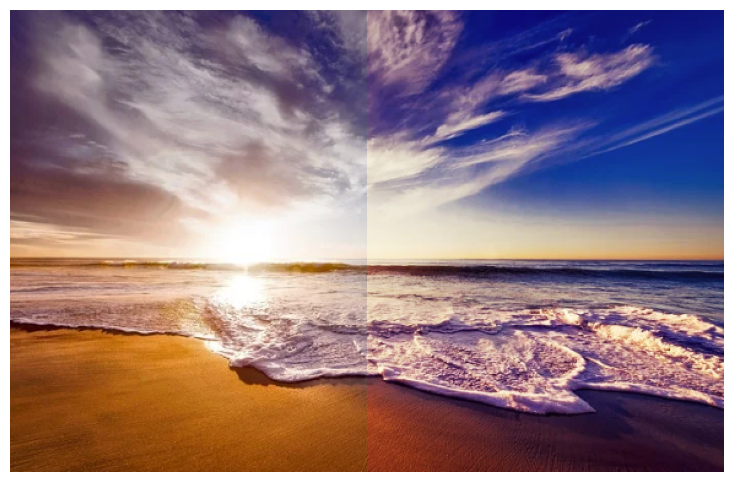

In [81]:
from pillow_lut import load_cube_file

lut = load_cube_file("images/Bourbon 64.cube") #NightFromDay.CUBE")
im = Image.open("images/day.png")
plt.figure(figsize=(10,6))
im_in = np.array(im)
im_out = np.array(im.filter(lut))
plt.imshow(np.hstack((im_in[:,:im_in.shape[1]//2], im_out[:,im_out.shape[1]//2:]))), plt.axis('off')
plt.show()

### γ-Correction with LUT

You can use a look-up table (LUT) to implement gamma correction. A lookup table is essentially an array or mapping that defines how each pixel value in the input image should be transformed to obtain a corresponding output value.  

### with PIL

The class `PIL.ImageFilter.Color3DLUT` can be used as a 3-D color lookup table. It transforms 3-channel pixels using the values of the channels as coordinates in the 3D lookup table and interpolating the nearest elements. It allows to apply almost any color transformation in constant time by using pre-calculated decimated tables. 

* The function `ImageFilter.Color3DLUT.generate()` can be used to generate the LUT of a given size (e.g., a $11\times 11\times 11$ LUT is used in the next code snippet) using the `lambda` function as *callback* as arguments to the function 
* Next the function `Image.filter()` can be used to perform the γ-correction of the input image with the LUT passed as a parameter, (there is no need to iterate over pixels), as shown in the code snippet below, the next figure shows the output.

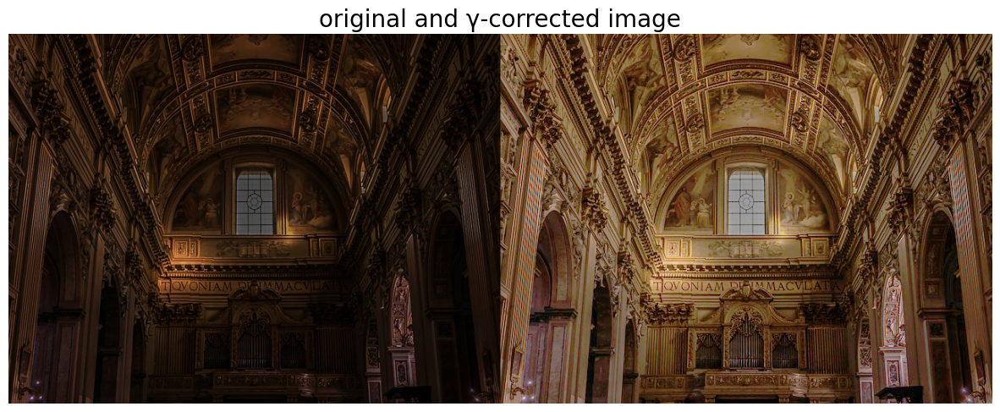

In [82]:
γ = 0.4
img = Image.open('images/roma.jpg')
# LUT = ImageFilter.Color3DLUT.generate((11,11,11), lambda r, g, b: (r**γ, g**γ, b**γ))
LUT = ImageFilter.Color3DLUT.generate((11,11,11), lambda r, g, b: tuple(min(max(c ** γ, 0), 1) for c in (r, g, b)))
img_out = img.filter(LUT)

plt.figure(figsize=(15,6))
plt.imshow(np.hstack((np.array(img), np.array(img_out)))), plt.axis('off')
plt.title('original and γ-corrected image', size=20)
plt.show()

### with PIL.Image.point()

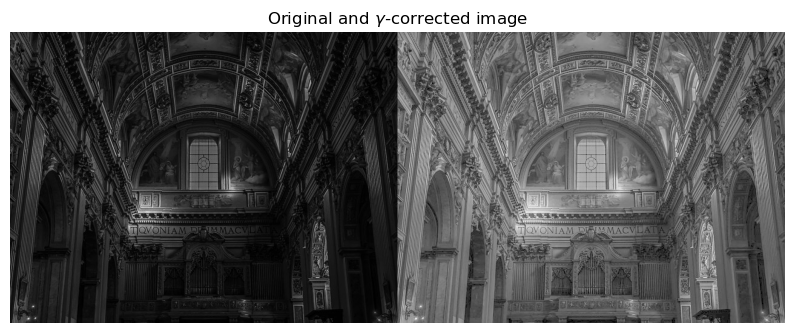

In [103]:
img_gray = img.convert('L')      # convert to grayscale image
min, max = img_gray.getextrema() # get the min and max pixel values
# print(max)
img_out = img_gray.point(lambda x: max * (x / max) ** γ) # normalize and apply gamma correction
plt.figure(figsize=(10,4))
plt.imshow(np.hstack((img_gray, img_out)), cmap='gray'), plt.axis('off'), plt.title(r'Original and $\gamma$-corrected image');

You can implement γ-Correction just using `point()` function instead (with a single line of code), this is left as an exercise.

### with opencv-python

You can implement the same with the function `γ_correct()` using `opencv-python`'s `cv2.LUT()` function to get similar output, as shown in the next code snippet.

In [ ]:
def γ_correct(img, γ):
    table = [((i / 255) ** γ) * 255 for i in range(256)]
    table = np.array(table, np.uint8)
    return cv2.LUT(img, table)

img = np.array(img)
plt.figure(figsize=(15,6))
plt.imshow(np.hstack((img, γ_correct(img, γ)))), plt.axis('off')
plt.title('original and γ-corrected image', size=20)
plt.show()

### Simulating Lens Blur Effects

In [44]:
from PIL import Image
from PIL.ExifTags import TAGS

# Load the image
image = Image.open("images/moon.jpg")

# Extract EXIF data
exif_data = image._getexif()

# Print EXIF metadata
if exif_data:
    for tag_id, value in exif_data.items():
        tag_name = TAGS.get(tag_id, tag_id)  # Get human-readable tag name
        print(f"{tag_name}: {value}")
else:
    print("No EXIF metadata found.")

No EXIF metadata found.


In [42]:
from PIL import ImageFilter
from PIL.ImageChops import lighter

image = Image.open('images/me8.jpg').convert('RGB')
mask = Image.open('images/mask.png').convert('L')
p = 0.5
r = 5
gammaCorrectedImage = image.point(lambda x: x ** p)  ## Or whatever power works for you.
bokeh = gammaCorrectedImage.filter(ImageFilter.GaussianBlur(radius=r)) #ImageFilter.BLUR)
bokeh = bokeh.point(lambda x: x ** (1/p)) # To get back the original gamma.
bokeh = Image.composite(image, bokeh, mask)
blurImage = image.filter(ImageFilter.GaussianBlur(radius=r)) #ImageFilter.BLUR) # #
blurImage = Image.composite(image, blurImage, mask)
finalImage = lighter(bokeh, blurImage) 
finalImage.show()

![](images/me8_lblur.jpg)

### Radial Blur

In [55]:
# Define width and height of image
W, H = 650, 650

# Create solid red image
im = Image.new(mode='RGB', size=(W,H), color=(255,255,255))

# Create radial alpha/transparency layer. 255 in centre, 0 at edge
Y = np.linspace(-1, 1, H)[None, :]*255
X = np.linspace(-1, 1, W)[:, None]*255
alpha = np.sqrt(X**2 + Y**2)
alpha = 255 - np.clip(alpha,0,255)

# Push that radial gradient transparency onto red image and save
im.putalpha(Image.fromarray(alpha.astype(np.uint8)))
im1 = Image.open('images/me8.jpg').convert('RGBA')
im2 = Image.alpha_composite(im1, im.resize(im1.size))

#im2 #.show()

### Interchanging Image Color Palettes

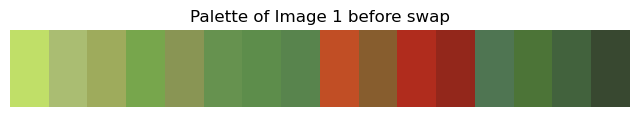

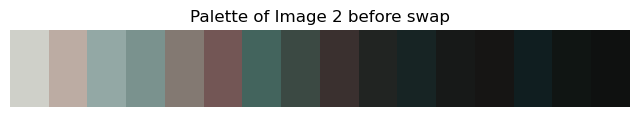

In [81]:
def plot_palette(palette, num_colors=16, title='Palette'):
    colors = np.array(palette[:num_colors*3]).reshape((num_colors, 3)) / 255
    plt.figure(figsize=(8,1))
    plt.title(title)
    plt.imshow([colors], aspect='auto')
    plt.axis('off')
    plt.show()

img1, img2 = Image.open('images/parrot.jpg'), Image.open('images/monalisa.jpg')
img1_p = img1.convert("P", palette=Image.ADAPTIVE, colors=16)
img1_p.save('images/parrot_adaptive16_orig.png')
img2_p = img2.convert("P", palette=Image.ADAPTIVE, colors=16)
img2_p.save('images/lena_adaptive16_orig.png')

#print(os.stat('images/parrot.jpg').st_size, os.stat('images/parrot_adaptive16_orig.png').st_size)
data = list(img1_p.getdata())
#print(data[50:70])
clrs = img1_p.getcolors()
#print(len(clrs))

# show up colors and palette
pal1 = img1_p.getpalette()
pal2 = img2_p.getpalette()

plot_palette(pal1, title='Palette of Image 1 before swap')
plot_palette(pal2, title='Palette of Image 2 before swap')

p_nzero = pal1[:len(clrs) * 3]
clrs.sort(key=lambda x: x[1])  # sort by color, for showing
#for v in [(clrs[i // 3], (p_nzero[i], p_nzero[i + 1], p_nzero[i + 2]))
    #for i in range(0, len(p_nzero), 3)]:
        #print(v)

img1_p.putpalette(pal2)
img1_p.save('images/parrot_adaptive16_remapped.png')
img2_p.putpalette(pal1)
img2_p.save('images/lena_adaptive16_remapped.png')

## Adjusting Temperature of an Image

The color temperature of an image refers to its overall color tone, measured in Kelvin (K). It represents the warmth (reddish/yellowish tones) or coolness (bluish tones) of an image.

* Lower Temperatures $(~1000K–4000K)$: Warmer, reddish tones (e.g., candlelight, sunrise).
* Neutral Temperature $(~5500K)$: Natural daylight.
* Higher Temperatures $(~6000K–10000K)$: Cooler, bluish tones (e.g., overcast sky, shade).

For example, A candle flame $(~1900K)$ is warm (orange/yellow), while a blue sky $(~8000K)$ is cool.

Color temperature adjustment is done by scaling the RGB channels using a transformation based on the desired temperature shift.

**Adjusting Using RGB Scaling**

A simple way to change an image’s temperature is to scale the Red, Green, and Blue channels based on the target temperature.

For an input image $I(x,y)=(R,G,B)$, we adjust it using $R^{\prime}=R\times\alpha_R, 𝐺^{\prime}=G\times\alpha_G, 𝐵^{\prime}=B\times\alpha_B$
​ 
where $𝛼_𝑅$, $𝛼_𝐺$, $𝛼_𝐵$ are scaling factors based on the Kelvin temperature.

For example,

- Warmer Shift (Increase Red, Decrease Blue): $α_R>1$,$α_G≈1$,$α_B<1$
- Cooler Shift (Increase Blue, Decrease Red): $𝛼_𝑅<1$,$𝛼_𝐺≈1$,$𝛼_𝐵>1$

**Adjusting Using a Color Transformation Matrix**

A more precise way is to use a color transformation matrix:

$$M=\begin{bmatrix} 
​α_R & 0 & 0 & 0\\
​0 & α_G & 0 & 0\\
​0 & 0 & α_B & 0
​\end{bmatrix}$$
​
Applying this to the image: $I^{\prime} = M⋅I$.

This transforms each pixel $(R, G, B)$ based on the Kelvin temperature correction factors.

For 3000K (warmer shift):
- Red remains unchanged (scaled by 1.0).
- Green is reduced to 70.5% of its original value.
- Blue is reduced to 42%, making the image appear warmer.

For 8000K (cooler shift):
- Red is reduced (0.89) to cool the image.
- Green is slightly adjusted (0.95).
- Blue is enhanced (1.1) to create a cooler effect.

The RGB equivalents of a temperature can be found here: http://www.vendian.org/mncharity/dir3/blackbody/.

Now, let's change an image’s color temperature using Kelvin-based RGB transformations, using the next code snippet. Here are the key steps:

- The code Uses a predefined kelvin_table with RGB values.
- Constructs a color transformation matrix.
- Applies it using `PIL`’s `Image.convert()` method.

The `convert(mode, matrix)` method in `PIL` allows linear color transformations using a transformation matrix $M$. it applies a linear transformation to each pixel's RGB values. Given an input pixel $(R,G,B)$, it transforms it to a new output pixel 
$(R^{\prime},G^{\prime},B^{\prime})$ as follows:

$$\begin{bmatrix}
𝑅^{\prime} \\
𝐺^{\prime} \\
𝐵^{\prime}
\end{bmatrix} = 
=
\underset{M}{\underbrace{\begin{bmatrix} 
​α_R & 0 & 0 & 0\\
​0 & α_G & 0 & 0\\
​0 & 0 & α_B & 0
​\end{bmatrix}}}
.
\begin{bmatrix}
𝑅 \\
𝐺 \\
𝐵 \\
1
\end{bmatrix}$$⋅

This transformation applies independently to every pixel in the image. It can be used to simulate different lighting conditions (e.g., candlelight, daylight, cool fluorescent lighting) and thus useful for photo color correction and artistic effects.

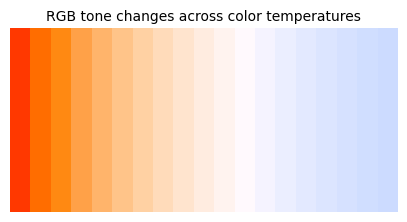

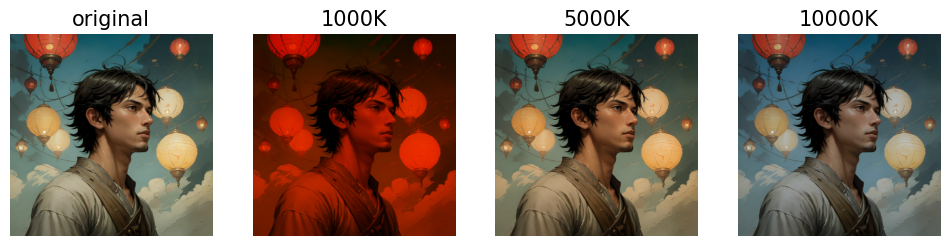

In [71]:
from PIL import Image

kelvin_table = {
    1000: (255,56,0),
    1500: (255,109,0),
    2000: (255,137,18),
    2500: (255,161,72),
    3000: (255,180,107),
    3500: (255,196,137),
    4000: (255,209,163),
    4500: (255,219,186),
    5000: (255,228,206),
    5500: (255,236,224),
    6000: (255,243,239),
    6500: (255,249,253),
    7000: (245,243,255),
    7500: (235,238,255),
    8000: (227,233,255),
    8500: (220,229,255),
    9000: (214,225,255),
    9500: (208,222,255),
    10000: (204,219,255)}

# Helper function to visualize RGB tone changes across Kelvin values
def visualize_kelvin_table(kelvin_table):
    bar = np.array([kelvin_table[k] for k in sorted(kelvin_table.keys())], dtype=np.uint8)
    bar = np.tile(bar[np.newaxis, :, :], (9, 1, 1))
    plt.figure(figsize=(5, 3))
    plt.imshow(bar)
    plt.xticks(ticks=np.linspace(0, len(kelvin_table)-1, 5), 
               labels=np.linspace(1000, 10000, 5, dtype=int))
    plt.title("RGB tone changes across color temperatures", size=10)
    plt.axis('off')
    plt.show()

visualize_kelvin_table(kelvin_table)

def convert_temp(image, temp):
    r, g, b = kelvin_table[temp]
    matrix = ( r / 255.0, 0.0, 0.0, 0.0,
               0.0, g / 255.0, 0.0, 0.0,
               0.0, 0.0, b / 255.0, 0.0 )
    return image.convert('RGB', matrix)

im = Image.open('images/boy.jpg').convert('RGB')
#print(im.mode)
plt.figure(figsize=(12,4))
plt.subplot(141), plt.imshow(im), plt.title('original', size=15), plt.axis('off') 
for i, k in enumerate([1000, 5000, 10000]):
    plt.subplot(1,4,i+2), plt.imshow(convert_temp(im, k)), plt.title(f'{k}K', size=15), plt.axis('off') 
plt.show()

## Fading an image

This code gradually fades an image from the top and bottom by modifying its alpha channel using a gradient mask. Let’s break it down step by step.

* **Load and Convert Image**: Loads the image in RGBA mode, where R, G, B represent color and A (alpha) controls transparency (0 = fully transparent, 255 = fully opaque).
* **Create an Alpha (Transparency) Mask**: `alpha = Image.new('L', (w, h))` creates a blank grayscale (L mode) image alpha of the same size as `im`. This alpha mask will determine how transparent each pixel is.
* **Create the Fading Effect**:
  - `alpha.paste(linear_gradient(mode='L').resize((w, int(h//2))), (0,0))`: Generates a linear gradient (black → white), resizes it to match the top half of the image ($w$ × $h/2$) and then pastes it at the top $(0,0)$ of `alpha`, making the top gradually fade.
  - `alpha.paste(flip(linear_gradient(mode='L').resize((w, h-int(h//2)))), (0,int(h//2)))`: Creates another linear gradient but flipped (white → black), resizes it to fit the bottom half of the image and then pastes it at the bottom (h/2), making the bottom fade.
  - **Apply the Alpha Mask**: Done by `im.putalpha(alpha)`.

Refer to the next code snippet:

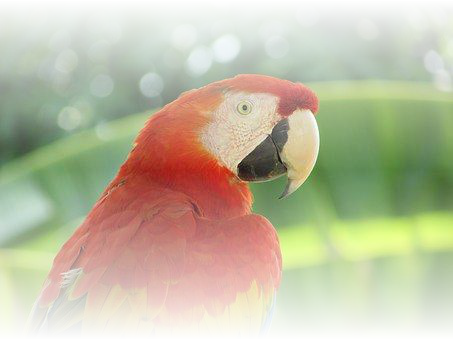

In [68]:
from PIL.Image import linear_gradient
from PIL.ImageOps import flip
im = Image.open('images/parrot.jpg').convert('RGBA')
w, h = im.size
alpha = Image.new('L', (w, h))
alpha.paste(linear_gradient(mode='L').resize((w, int(h//2))), (0,0))
alpha.paste(flip(linear_gradient(mode='L').resize((w, h-int(h//2)))), (0,int(h//2)))
im.putalpha(alpha)
im

## Applying Vignetting and Lomography Effect

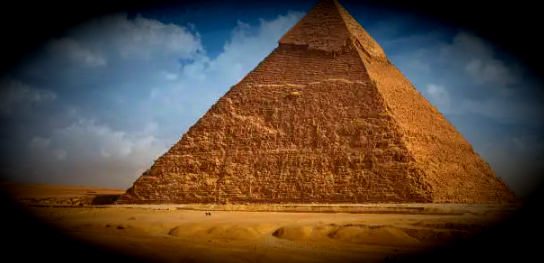

In [104]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance

def apply_vignette(img, alpha=0.7, p=2.5):
    rows, cols = img.shape[:2]
    x, y = np.meshgrid(np.linspace(-1, 1, cols), np.linspace(-1, 1, rows))
    d = np.sqrt(x**2 + y**2)
    vignette = 1 - alpha * (d ** p)
    vignette = np.clip(vignette, 0, 1).astype(np.float32)  
    
    for i in range(3):  # Apply to R, G, B channels
        img[:, :, i] = img[:, :, i] * vignette
    return img

def lomography_effect(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    
    # Vignette Effect
    img = apply_vignette(img)

    # Increase Saturation
    pil_img = Image.fromarray(img)
    enhancer = ImageEnhance.Color(pil_img)
    img = np.array(enhancer.enhance(1.3))  # 30% saturation increase

    # Increase Contrast
    enhancer = ImageEnhance.Contrast(Image.fromarray(img))
    img = np.array(enhancer.enhance(1.5))  # 50% contrast increase
    
    return Image.fromarray(img)

# Apply effect and display
lomo_img = lomography_effect("images/pyramid.png")
lomo_img

### Generating Image with PIL

`PIL` can be used to generate images of the following types:

* Mandelbrot set: with the function `effect_mandelbrot()`, covering the given extent. The parameters it accepts are 
   * `size`: the requested size in pixels, as a 2-tuple: (width, height).
   * `extent`: the extent to cover, as a 4-tuple: (x0, y0, x1, y1).
   * `quality`: quality of the image.

* Gaussian noise of size (256 x 256) centered around (128 x 128): with the function `effect_noise()`. The parameters it accepts are
    * `size`: the requested size in pixels, as a 2-tuple: (width, height).
    * `sigma`: standard deviation of noise.

* 256x256 linear gradient from black to white, top to bottom: with the function `linear_gradient()`, accepting the parameter `mode` (input mode).

* 256x256 radial gradient from black to white, centre to edge: witj the function `radial_gradient()`, again accepting the parameter `mode` (input mode).

The next code snippet demonstrates the generation of the images.

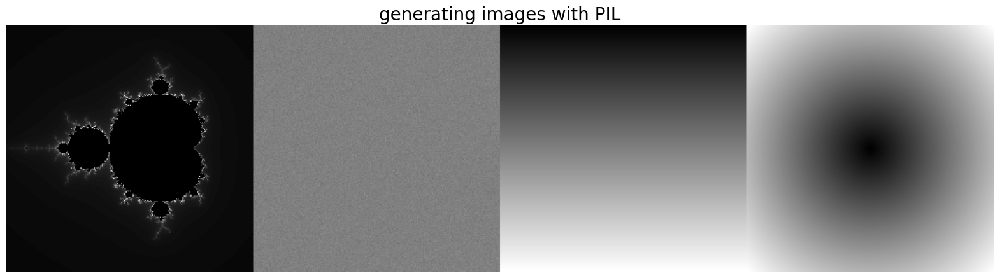

In [114]:
from PIL.Image import effect_mandelbrot, effect_noise, linear_gradient, radial_gradient

sz = (256, 256)
plt.figure(figsize=(20,8))
plt.imshow(np.hstack((
                    effect_mandelbrot(size=sz, extent=(-2, -1.5, 1, 1.5), quality=100),
                    effect_noise(size=sz, sigma=5),
                    linear_gradient(mode='L'),
                    radial_gradient(mode='L')
            )))
plt.axis('off')
plt.title('generating images with PIL', size=20)
plt.show()

## Image Manipulation with `opencv-python`

As discussed earlier, OpenCV-Python is a powerful and widely-used library for image manipulation and computer vision tasks in the Python programming language. Renowned for its simplicity and efficiency, OpenCV-Python empowers developers to perform a diverse range of image processing operations, from basic transformations to advanced computer vision applications. In this section you will learn how to implement a few image manipulation tasks with the library functions.

### Resizing image

In [ ]:
image = cv2.cvtColor(cv2.imread('images/monalisa.jpg'), cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(image, None, fx=0.5, fy=0.5)
plt.subplot(121), plt.imshow(image), plt.title('original', size=15)
plt.subplot(122), plt.imshow(resized_image), plt.title('resized', size=15)
plt.show()

### Rotating Image

In [113]:
def plot_image(im, title='', fontsize=20): 
     plt.imshow(im, aspect='auto'), plt.axis('off'), plt.title(title, size=fontsize) 
         
def plot_images(images, titles, suptitle='', fontsize=20, \
                                supfontsize=22, figsize=(15,7)): 
    n = len(images) 
    plt.figure(figsize=figsize) 
    plt.gray() 
    for i in range(n): 
        plt.subplot(1,n,i+1), plot_image(images[i], titles[i], fontsize) 
    plt.suptitle(suptitle, size=supfontsize) 
    plt.tight_layout() 
    plt.show()

In [ ]:
image = cv2.cvtColor(cv2.imread('images/fruits.png'), cv2.COLOR_BGR2RGB)
rotation_angle = 45
rows, cols = image.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), rotation_angle, 1)
rotated_image_anticlockwise = cv2.warpAffine(image, rotation_matrix, (cols, rows))
rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), -rotation_angle, 1)
rotated_image_clockwise = cv2.warpAffine(image, rotation_matrix, (cols, rows))

plot_images([image, rotated_image_anticlockwise, rotated_image_clockwise], \
            ['original', 'rotated counterclockwise', 'rotated clockwise'])

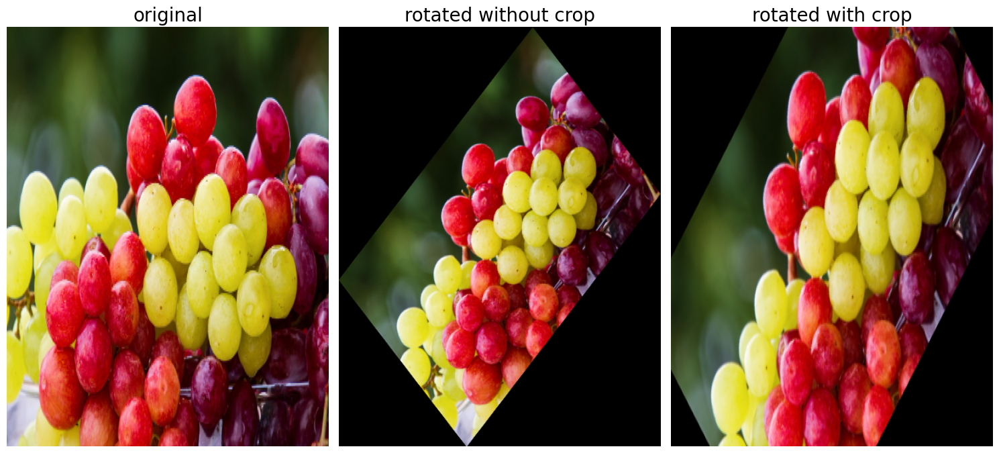

In [114]:
def rotate_image_no_crop(image, angle):
    rows, cols = image.shape[:2]
    # Calculate center of the image
    center = (cols / 2, rows / 2)

    # Compute rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Compute sine and cosine (absolute values)
    abs_cos = abs(rotation_matrix[0, 0])
    abs_sin = abs(rotation_matrix[0, 1])

    # Compute new bounding dimensions
    new_w = int(rows * abs_sin + cols * abs_cos)
    new_h = int(rows * abs_cos + cols * abs_sin)

    # Adjust rotation matrix to account for translation
    rotation_matrix[0, 2] += (new_w / 2) - center[0]
    rotation_matrix[1, 2] += (new_h / 2) - center[1]

    # Perform the rotation with the updated bounding box size
    rotated = cv2.warpAffine(image, rotation_matrix, (new_w, new_h))
    return rotated

rotated_no_crop = rotate_image_no_crop(image, rotation_angle)
plot_images([image, rotated_no_crop, rotated_image_anticlockwise], \
            ['original', 'rotated without crop', 'rotated with crop'])

![](images/rot.gif)

## Implementing Crosshatch Filter

A **crosshatch** filter is an image-processing technique that enhances diagonal edges by applying a kernel that resembles crisscrossing lines, mimicking the traditional hatching technique used in drawing. The filter works by emphasizing diagonal features in an image through convolution with a structured kernel. The next code snippet implements crosshatch filter using `opencv-python`, let's break the code down:

* Loads an image using `opencv-python`'s `imread()` function (note that it loads RGB images as BGR).
* **Understanding the Kernel Creation**
    - `np.eye(length, dtype=np.float32)`: Creates an identity matrix of size $24\times 24$. The identity matrix has 1s on the main diagonal and 0s elsewhere:
    ​
        $$\begin{bmatrix}
        1 & 0 & \ldots & 0 & 0 \\
        0 & 1 & \ldots & 0 & 0 \\
        ​\ldots & ​\ldots & ​\ldots & ​\ldots & ​\ldots \\
        0 & 0 & \ldots & 1 & 0 \\
        0 & 0 & \ldots & 0 & 1
        \end{bmatrix}$$
      
    - `kern[:, ::-1]`: Flips the identity matrix horizontally, creating a secondary diagonal with 1s:
    
        $$\begin{bmatrix}
        0 & 0 & \ldots & 0 & 1 \\
        0 & 0 & \ldots & 1 & 0 \\
        ​\ldots & ​\ldots & ​\ldots & ​\ldots & ​\ldots \\
        0 & 1 & \ldots & 0 & 0 \\
        1 & 0 & \ldots & 0 & 0
        \end{bmatrix}$$
      
     - `np.maximum(kern, kern[:,::-1])`: Takes the element-wise maximum of the identity matrix and its flipped version, producing a crosshatch pattern:
        
  $$\begin{bmatrix}
        1 & 0 & \ldots & 0 & 1 \\
        0 & 1 & \ldots & 1 & 0 \\
        ​\ldots & ​\ldots & ​\ldots & ​\ldots \\
        0 & 1 & \ldots & 1 & 0 \\
        1 & 0 & \ldots & 0 & 1
        \end{bmatrix}$$
    
    - `kern / (2 * length)`: Normalizes the kernel by dividing by `2 * length = 48` to ensure the convolution doesn’t drastically change brightness.
 
* `cv.filter2D(im, -1, kern)`: Applies the crosshatch convolution to the image. Enhances diagonal edges, creating a stylized effect resembling crosshatching.
*  `plt.imshow(np.hstack((im, res)))`: horizontally stacks (`hstack`) the original image (`im`) and the filtered image (`res`), displays them side by side using `imshow()`
*  `plt.axis('off')`: removes axis labels.
*  `plt.tight_layout()`: automatically adjusts subplot parameters to ensure that plots fit within the figure area without overlapping

Now, refer to the following code snippet:

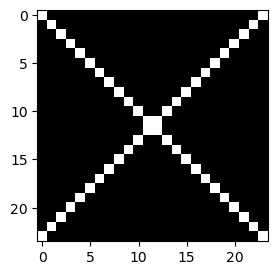

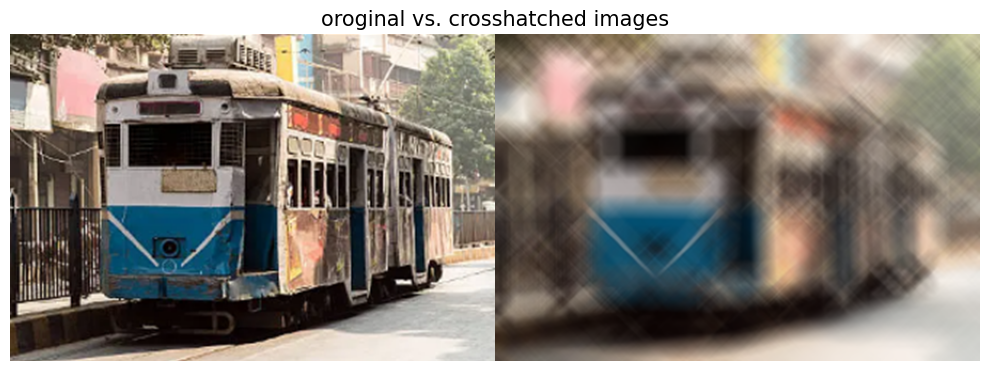

In [76]:
import cv2
import numpy as np
 
im = cv2.imread('images/tram.png') 
 
length = 24 #24
kern = np.eye(length, dtype=np.float32)
kern = np.maximum(kern, kern[:,::-1]) / (2 * length)
plt.figure(figsize=(3,3))
plt.imshow(kern, cmap='gray')
plt.show()
#print(kern)  
res = cv2.filter2D(im, -1, kern)
im, res = cv2.cvtColor(im, cv2.COLOR_RGB2BGR), cv2.cvtColor(res, cv2.COLOR_RGB2BGR)

plt.figure(figsize=(10,5))
plt.imshow(np.hstack((im,res))), plt.axis('off')
plt.title('oroginal vs. crosshatched images', size=15)
plt.tight_layout()
plt.show()

### Flip image

In [ ]:
im = cv2.cvtColor(cv2.imread('images/parrot.png'), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15,7))
plt.imshow(np.hstack((im,
            cv2.flip(im, flipCode=0), # Flip Image Vertically
            cv2.flip(im, flipCode=1), # Flip Image Horizontally
            # Flip Image Vertically and Horizontally
            cv2.flip(im, flipCode=-1)))), plt.axis('off')
plt.show()

### Applying Homography (Projective Transformation)

### with `opencv-python`

In [108]:
im_src = cv2.imread('images/books.jpg')
height, width, dim = im_src.shape
src = np.array([[267., 364.],
       [312., 683.],
       [555., 598.],
       [561., 284.]], dtype='float32')
dst = np.array([[   0.,    0.],
       [0, height-1],
       [width-1, height-1],
       [width-1, 0.]], dtype='float32')

def plot_images(src, dst):
    plt.figure(figsize=(7,7))
    plt.subplot(121), plt.imshow(src), plt.axis('off'), plt.title('Source image', size=15)
    plt.subplot(122), plt.imshow(dst), plt.axis('off'), plt.title('Destination image', size=15)
    plt.tight_layout()
    plt.show()

* Use `cv2.getPerspectiveTransform()` to compute the perspective transformation matrix based on the corresponding points. The `perspective_matrix` is a 3x3 matrix that represents the perspective transformation.
* Once you have the perspective transformation matrix, you can use it to transform coordinates or warp an image, using the function `cv2.warpPerspective()`.

In [99]:
%timeit M = cv2.getPerspectiveTransform(src, dst)
%timeit im_dst = cv2.warpPerspective(im_src, M, (width, height), flags=cv2.INTER_LINEAR)
#plot_images(im_src, im_dst)

4.22 µs ± 160 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)
7.21 ms ± 385 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


### with `scikit-image.transform.warp()`

The `skimage.transform.warp()` function can be used to apply geometric transformations to images. It is a versatile function that allows you to specify a transformation function or a precomputed transformation matrix. The function `skimage.transform.warp()` performs backward transformation, whereas `cv2.warpPerspective()` demonstrated earlier performs forward transformation. 

The function accepts the input (source) `image` along with an inverse coordinate map `inverse_map` argument, which transforms coordinates in the output image into their corresponding coordinates in the input image (this can be obtained by taking an inverse of the transforation matrix `M`).

You can specify the interpolation method used during the transformation by setting the `order` parameter, the default  interpolation method being `'nearest'`.

In [436]:
%timeit im_dst = warp(im_src, np.linalg.inv(M), clip=False)
#plot_images(im_src, im_dst)

136 ms ± 17.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


### with `scikit-image.transform.ProjectiveTransform`

In `scikit-image`, `ProjectiveTransform` is a class that represents a 2D projective transformation, which can be used to perform geometric transformations on images, such as rotation, scaling, translation, and skewing. You create an instance of `ProjectiveTransform` by providing a transformation matrix. 

* The transformation matrix ($3 \times 3$) can also be estimated using the `estimate()` method of `ProjectiveTransform`. It estimates the transformation matrix $M$ from a set of corresponding points (from the source and destination images). The parameters are determnied with the total least-squares method. Number of source and destination coordinates must match. Finally, use the `inverse()` method to return a transform object representing the inverse.

* The function `warp_persective()` in the next code snippet (defined with **type annotations**) again implements the homography. 

* It first estimates the `inverse_map` from the set of matching points `src_pts` and `dst_pts` from the sources and destination images, respectively. 

* Then it uses the inverse transformation to obtain the source indices corresponding to the destination images (it also clips the coordinates). 

* Finally, the destination images are obtained by selecting the pixels from the source image using the source indices obtained. Effectively, it implements the `warp()` function. 

The next code snippet demonstrates how the function works, with the following figure representing the input image warped to produce the output as shown. 

149 ms ± 25.5 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


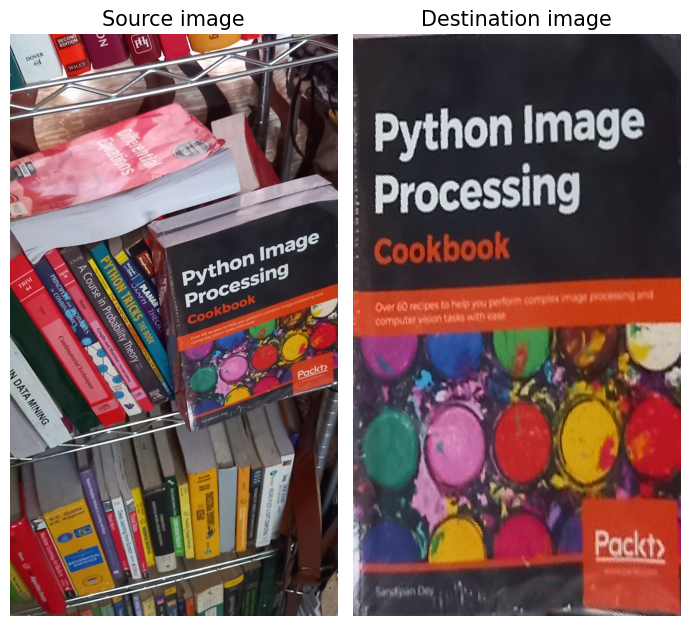

In [102]:
def warp_projective(src_pts: np.ndarray, dst_pts: np.ndarray, im_src: np.ndarray) -> np.ndarray:
    src, dst = src_pts[:, [1, 0]], dst_pts[:, [1, 0]]
    pt = ProjectiveTransform()
    pt.estimate(src, dst)
    x, y = np.mgrid[:height, :width]
    dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 
    src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
    valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >= 0))
    dst_indicies_valid = dst_indices[valid_idx]
    src_indicies_valid = src_indices[valid_idx]
    im_dst = np.zeros_like(im_src)
    im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]
    return im_dst.astype(np.uint8) 
    
%timeit im_dst = warp_projective(src, dst, im_src)
plot_images(im_src, im_dst)

In [ ]:
import numpy as np
import cv2
import matplotlib.pylab as plt

lower1 = np.array([0,100,100])
upper1 = np.array([5,255,255])

lower2 = np.array([165,100,100])
upper2 = np.array([180,255,255])
    
cap = cv2.VideoCapture("images/cars.mp4") 
fps = cap.get(cv2.CAP_PROP_FPS) 
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(fps, width, height)

output = cv2.VideoWriter("images/output.mp4", cv2.VideoWriter_fourcc(*'x264'), fps, (width, height)) 

frames, results = [], []
i = 0
while True: 
    ret, frame = cap.read() 
    if ret: 
        result = frame.copy()
        if i % 25 == 0:
            frames.append(frame)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        mask1 = cv2.inRange(frame, lower1, upper1)
        mask2 = cv2.inRange(frame, lower2, upper2)
        result = cv2.bitwise_and(result, result, mask=cv2.bitwise_or(mask1, mask2))
        if i % 25 == 0:
            results.append(result)
        output.write(result) 
        i += 1
    else:
        break

output.release() 
cap.release() 

print(len(frames))
plt.figure(figsize=(6,9))
plt.subplots_adjust(0,0,1,0.95,0.01,0.01)
i, j = 0, 0
while j < len(frames):
    plt.subplot(5,2,i+1), plt.imshow(cv2.cvtColor(frames[j], cv2.COLOR_BGR2RGB)), plt.axis('off') #, plt.title(f'frame', size=15)
    plt.subplot(5,2,i+2), plt.imshow(cv2.cvtColor(results[j], cv2.COLOR_BGR2RGB)), plt.axis('off') #, plt.title('red cars', size=15)
    i += 2
    j += 1
plt.show()

In [ ]:
from IPython.display import HTML
from base64 import b64encode

html_str=""

for filepath in ['images/cars.mp4', 'images/output.mp4']:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

### Simulating fish-eye effect

In [ ]:
from typing import Type

def apply_fisheye_effect(img: np.ndarray, K: np.ndarray, d: np.ndarray) -> np.ndarray:
    
    indices = np.array(np.meshgrid(range(img.shape[0]), range(img.shape[1]))).T \
                .reshape(np.prod(img.shape[:2]), -1).astype(np.float32)

    Kinv = np.linalg.inv(K)
    indices1 = np.zeros_like(indices, dtype=np.float32)
    for i in range(len(indices)):
        x, y = indices[i]
        indices1[i] = (Kinv @ np.array([[x], [y], [1]])).squeeze()[:2]
    indices1 = indices1[np.newaxis, :, :]
    
    in_indices = cv2.fisheye.distortPoints(indices1, K, d)
    indices, in_indices = indices.squeeze(), in_indices.squeeze()

    distorted_img = np.zeros_like(img)
    for i in range(len(indices)):
        x, y = indices[i]
        ix, iy = in_indices[i]
        if (ix < img.shape[0]) and (iy < img.shape[1]):
            distorted_img[int(ix),int(iy)] = img[int(x),int(y)]
    in_indices = in_indices.astype(int)
    #distorted_img  = distorted_img[np.min(in_indices[:,0]):np.max(in_indices[:,0]), np.min(in_indices[:,1]):np.max(in_indices[:,1])]
    #plt.imsave('images/chess_distorted.png', distorted_img)
    return distorted_img

K = np.array( [[338.37324094,0,319.5],[0,339.059099,239.5],[0,0,1]],dtype=np.float32) # camera intrinsic params
d = np.array([0.17149, -0.27191, 0.25787, -0.08054],dtype=np.float32) # k1, k2, k3, k4 - distortion coefficients

img = plt.imread('images/parrot.jpg')
img = img / img.max()
distorted_img = apply_fisheye_effect(img, K, d)

plt.figure(figsize=(12,5))
plt.subplot(121), plt.imshow(img, aspect='auto'), plt.axis('off'), plt.title('original', size=20)
plt.subplot(122), plt.imshow(distorted_img, aspect='auto'), plt.axis('off'), plt.title('distorted', size=20)
plt.tight_layout()
plt.show()

### Removing fish-eye distortion

The next code snippet demonstrates the process of removing fisheye distortion from an image using opencv-python. Here is how it works:

- The function `cv2.fisheye.initUndistortRectifyMap()` initializes undistortion maps (unfishmap1 and unfishmap2) based on the original camera parameters and new size.
- It reads the distorted image (`img`) using `matplotlib.pylab.imread()`.
- It uses the function `cv2.remap()` to undistort the image based on the computed undistortion maps, here are the parameters the function accepts:
    - `src`: input image.
    - `map1`, `map2`: maps of the same size as src, specifying the new $(x,y)$ coordinates of each pixel in the output image.
    - `interpolation`: Interpolation method to be used, determines how pixel values are computed for the new image. (here we have used `cv2.INTER_LINEAR`).
    `borderMode (optional)`: Pixel extrapolation method, in case the new coordinates fall outside the input image boundaries. Default is `cv2.BORDER_CONSTANT`.
- Plots the original distorted image and the undistorted image side by side for visualization, using the function `plot_images()` defined in the 1st chapter.

Refer to the next code snippet:

In [ ]:
# https://stackoverflow.com/questions/67257397/opencv-undistortpoints-doesnt-undistort?noredirect=1&lq=1
# https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

# camera parameters, to be computed during callibration
K = np.array( [[338.37324094,0,319.5],[0,339.059099,239.5],[0,0,1]],dtype=np.float64)
D = np.array( [[ 0.01794191], [-0.12190366],[ 0.14111533],[-0.09602948]],dtype=np.float64)
new_size = (640, 480)

Knew = K.copy()
#alpha = 0.6
#Knew, roi = cv2.getOptimalNewCameraMatrix(K, D, new_size, alpha, new_size,centerPrincipalPoint = True)
    
unfishmap1, unfishmap2 = cv2.fisheye.initUndistortRectifyMap(K, D, np.eye(3), Knew, new_size, cv2.CV_32F)

#img = cv2.imread('images/3FYUT.jpg') 
img = plt.imread('images/chess_distorted.png')
img_undistorted = cv2.remap(img, unfishmap1, unfishmap2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT) 

x, y, w, h = roi
#img_undistorted = img_undistorted[y:y+h, x:x+w]

plt.figure(figsize=(15,7))
plt.subplot(121), plt.imshow(img, aspect='auto'), plt.axis('off'), plt.title('distorted', size=20)
plt.subplot(122), plt.imshow(img_undistorted, aspect='auto'), plt.axis('off'), plt.title('undistorted', size=20)
plt.tight_layout()
plt.show()

### with `defisheye`

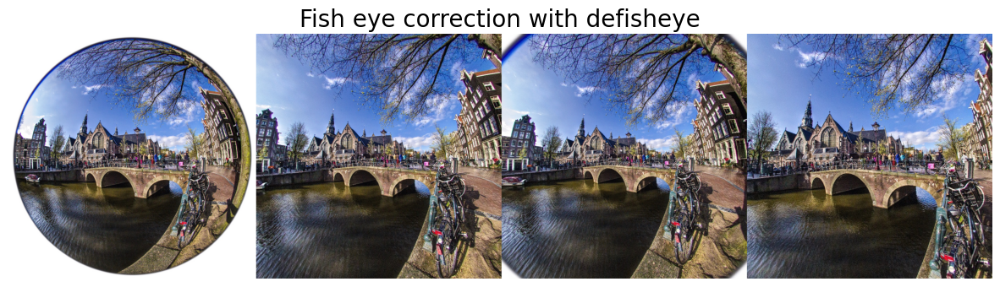

In [356]:
from defisheye import Defisheye

dtype = 'linear'
format = 'fullframe'
fov = 180
pfov = 120

img = "images/fishy.jpeg"

dtypes = ['linear', 'equalarea', 'stereographic']
cor_imgs = []
for dtype in dtypes:
    #img_out = f"images/out/example3_{dtype}_{format}_{pfov}_{fov}.jpg"
    obj = Defisheye(img, dtype=dtype, format=format, fov=fov, pfov=pfov)
    # To save image locally 
    #obj.convert(outfile=img_out)
    cor_img = obj.convert()
    #print(cor_img.shape)
    cor_imgs.append(cv2.cvtColor(cor_img, cv2.COLOR_BGR2RGB))

plt.figure(figsize=(15,7))
plt.imshow(np.hstack((plt.imread(img), cor_imgs[0], cor_imgs[1], cor_imgs[2]))), plt.axis('off')
plt.title('Fish eye correction with defisheye', size=20)
plt.show()

### Image Manipulation with `scipy.ndimage` module

We can use the `nbdimage` module from the library `scipy` too for image manipulation, the next
section shows couple of examples.

### Applying an Affine Transformation to an Image

We can use the function `affine_transform()` and provide the 3 x 3 transformation matrix (in
homogeneous coordinates) and the offset, to carry out the transformation, as shown in the
next code block.

In [ ]:
im = imread("images/parrot.png")
transformed = affine_transform(im, [[np.cos(np.pi/4),np.sin(np.pi/4), 0],[-np.sin(np.pi/4),np.cos(np.pi/4), 0], [0,0,1]],
offset=[-im.shape[0]/2+75, im.shape[1]/2-50, 0], output_shape=im.shape)
plt.imshow(transformed), plt.axis('off')
plt.show()

### Zooming an image

The next code block demonstrates how to use the `zoom()` function from the `scipy.ndimage`
module to zoom in and then crop a portion of image using numpy ndarray slicing. The next figure shows the output of the code block.

In [ ]:
im = imread('images/parrot.jpg') / 255
zoomed_im = ndimage.zoom(im, (2,2,1), mode='nearest', order=1) # no zoom on color channel, order of the spline interpolation = 1
print(im.shape, zoomed_im.shape)
plt.figure(figsize=(10,5))
plt.subplot(121), plt.imshow(im,aspect='auto'), plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(zoomed_im[150:400,350:650,:], aspect='auto') # crop the enlarged face
plt.title('Zoomed and Cropped Image', size=20)
plt.tight_layout()
plt.show()

### Interpolating an Image

Now, you will see how the same function `ndimage.zoom()` can be used to zoom the small clock image twice with spline interpolation of different orders. The next figure plots the outputs obtained and also shows that output image with interpolation of order $4$ spline interpolation obtains a much better apprximation of the resized image (much sharper, hence contains much more details) than the one obtained with order $1$.

In [ ]:
im = imread('images/clock.png')
n = 2
interp_images = []
for k in range(1,5):
    zoomed_im = ndimage.zoom(im, (n,n,1), mode='nearest', order=k) # no zoom on color channel, order of the spline interpolation = 1
    interp_images.append(zoomed_im) 
interp_images.append(interp_images[-1]-interp_images[0])
plt.figure(figsize=(20,7))
plt.imshow(np.hstack(interp_images)), plt.axis('off')
plt.title('output with spline interpolation of order 1,2,3,4 and the diff between the last and the first interpolated image', size=20)
plt.show()

### Applying Wave distortion to an image

In [ ]:
im = imread('images/lena.jpg', True)
x,y = np.meshgrid(np.float32(np.arange(im.shape[1])),np.float32(np.arange(im.shape[0])))
y = y + 20*np.sin(x/15)
distorted = ndimage.map_coordinates(im, [y.ravel(),x.ravel()])
plt.imshow(distorted.reshape(im.shape)), plt.axis('off')
plt.show()

## Image Manipulation with wand

`Wand` is a Python binding for `ImageMagick`, a software suite for creating, editing, composing, or converting images. 

In [1]:
!python -VV

Python 3.8.16 (default, Jan 17 2023, 22:25:28) [MSC v.1916 64 bit (AMD64)]


In [3]:
import os
os.environ['MAGICK_HOME']

'C:\\Program Files\\ImageMagick-7.1.1-Q16-HDRI'

### Creating Visual Effects 

If you're looking to create visual effects using Wand (Python's ImageMagick binding), you can follow these general steps:

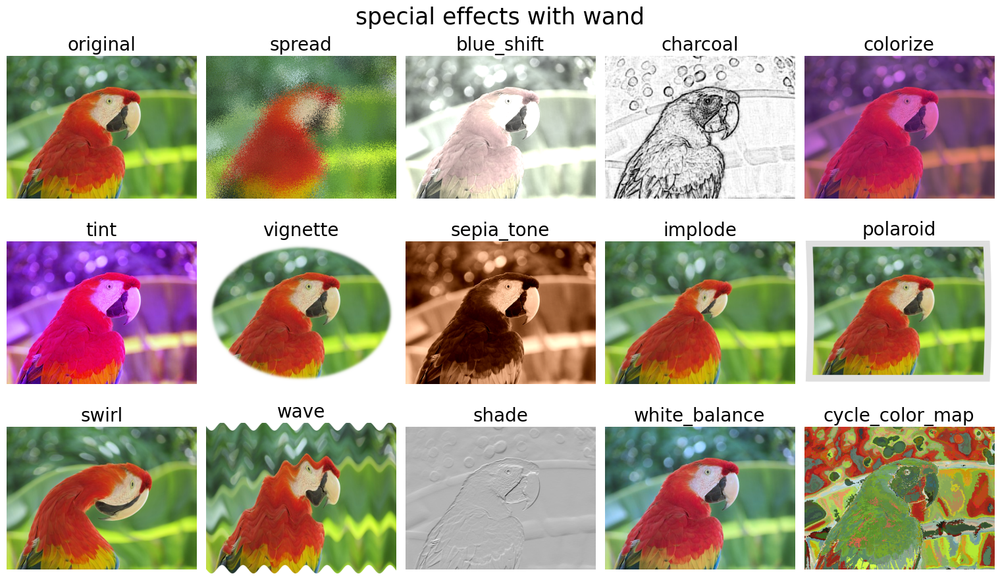

In [97]:
# https://docs.wand-py.org/en/latest/guide/install.html#install-imagemagick-on-windows
# https://imagemagick.org/script/download.php#windows
# https://docs.wand-py.org/en/0.5.9/guide/fx.html#blue-shift
from wand.image import Image as ImageW
from wand.color import Color

def call_func(img, func_name):
    img = img.clone()
    func = getattr(img, func_name)
    arg_dict = functions[func_name]
    func(**arg_dict)
    return img
        
functions = {'spread': {'radius':16.0}, 'blue_shift': {'factor':2}, 
             'charcoal': {'radius':2, 'sigma':1}, 'colorize': {'color': 'magenta', 'alpha':"rgb(10%, 50%, 20%)"},
             'tint': {'color': 'magenta', 'alpha':"rgb(50%, 70%, 80%)"}, 'vignette': {'sigma':3, 'x':15, 'y':15},
             'sepia_tone': {'threshold': 0.9}, 'implode': {'amount':0.5}, 
             'polaroid': {}, 'swirl': {'degree': -120}, 'wave': {'amplitude': 10, 'wave_length':50},
             'shade': {'gray':True, 'azimuth':100.0, 'elevation':45.0}, 'white_balance': {},
             'cycle_color_map': {'offset': 50}
            }

plt.figure(figsize=(15,9))
plt.gray()
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
with ImageW(filename="images/parrot.png") as img:
    plt.subplot(3,5,1), plt.imshow(np.array(img)), plt.axis('off'), plt.title('original', size=20)
    i = 2
    for func_name in functions:
        out_img = call_func(img, func_name)
        plt.subplot(3,5,i), plt.imshow(np.array(out_img)), plt.axis('off'), plt.title(func_name, size=20)
        i += 1
plt.suptitle('special effects with wand', size=25)
plt.show()

### Applying Sketch, solarize and fx_fliter

In [106]:
with ImageW(filename="images/parrot.png") as img:
    img.transform_colorspace("gray")
    img.sketch(0.6, 0.1, 95.0)

In [107]:
with ImageW(filename="images/parrot.png") as img:
    img.solarize(threshold=0.5 * img.quantum_range)

In [ ]:
fx_filter="(hue > 0.895 || hue < 0.095) ? u : lightness"
with ImageW(filename="images/parrot.png") as img:
    filtered_img = img.fx(fx_filter)        

### Distorting and Undistorting Images

Distorting and undistorting images are common tasks in computer vision and image processing. Distortion can occur due to various factors, such as the lens used to capture the image. Undistorting is the process of correcting these distortions. The most common type of distortion is radial distortion, which causes straight lines to appear curved. Here's a general overview of how to distort and undistort images:

#### Distortion
1. Choose a Distortion Model:
The most common distortion model is radial distortion, which can be modeled using the Brown-Conrady model. This model includes parameters like radial distortion coefficients and tangential distortion coefficients.
2. Compute Distortion:
Use the distortion model parameters to compute the distorted coordinates of each pixel in the image.
3. Apply Distortion:
Map the original pixel coordinates to the distorted coordinates using the computed distortion. This will result in a distorted image.

#### Undistortion
1. Calibrate Camera:
Capture images of a known calibration pattern (e.g., checkerboard) at different orientations and distances. Use these images to calibrate the camera and estimate distortion parameters.
2. Undistort Images:
Apply the distortion parameters to undistort the image. This process involves mapping the distorted pixel coordinates to undistorted coordinates.
3. Use a Library or Framework:
Many computer vision libraries and frameworks, such as OpenCV in Python, provide functions to calibrate cameras and undistort images. 

In this section, we shall simulate a few distortion models using `wand.Image` methods and apply inverse distorion to get the original image back (assuming the parameters for the distortion model known). However, if the paramaters are not known, we need to first estimate the parameters (e.g., using camera calibration), which we shall discuss in later chapters.

### Barrel, Polar, Arc and Shepards distortion

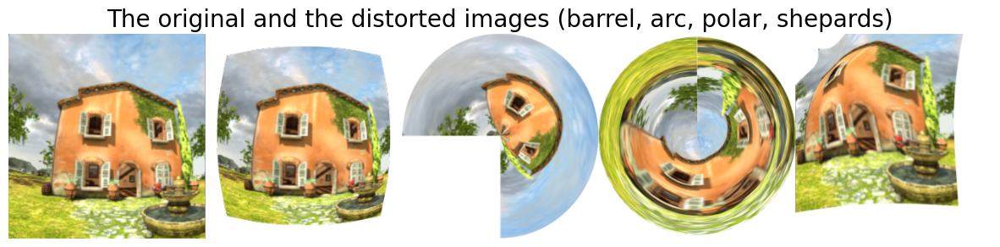

In [61]:
with ImageW(filename='images/house.png') as im:
    w, h = im.size
    im.virtual_pixel = 'transparent' # 'black'
    im_out_barrel = im.clone()
    im_out_barrel.distort('barrel', (0.2, 0.0, 0.0, 1.0))
    im_out.save(filename='images/house_distorted.png')
    im_out_polar = im.clone()
    im_out_polar.distort('polar', (0,)) 
    im_out_arc = im.clone()
    im_out_arc.distort('arc', (270, 45)) # ArcAngle, RotateAngle
    im_out_arc.resize(w,h)
    im_out_shepards = im.clone()
    im_out_shepards.artifacts['distort:viewport'] = "260x260-10+10"
    im_out_shepards.artifacts['shepards:power'] = "4.0"    
    im_out_shepards.distort('shepards', (0, 0, 20, 30, 150, 146, 60, 70))
    im_out_shepards.resize(w,h)
    plt.figure(figsize=(15,7))
    plt.imshow(np.hstack((np.array(im), np.array(im_out_barrel), 
                          np.array(im_out_arc), np.array(im_out_polar), np.array(im_out_shepards))))
    plt.axis('off'), plt.title('The original and the distorted images (barrel, arc, polar, shepards)', size=20)
    plt.show()

### Correct distortion by Undistorting

You can undo a `barrel` distortion by applying a `barrel_inverse` distortion (which produces an inward bump, to the contrary), using the following code snippet.

In [ ]:
with ImageW(filename='images/house_distorted.png') as im:
    im_out_cor = im.clone()
    im_out_cor.distort('barrel_inverse', (0.2, 0.0, 0.0, 1.0))
    plt.figure(figsize=(9,4))
    plt.imshow(np.hstack((np.array(im), np.array(im_out_cor))))
    plt.axis('off'), plt.title('The distorted and corrected images', size=15)
    plt.show()

### Drawing Convex Hull

The method `Image.convex_hull()` finds the smallest convex polygon, and returns a list of (corner) points of the polygon. In the next code snippet we first obtain the set of points defining the convex hull of the objects in the image using the method `convex_hull()` and then draw a polygon (with red boundary) using those points using the `polygon()` method.

In [ ]:
from wand.drawing import Drawing

with ImageW(filename='images/blocks.png') as img:
    points = img.convex_hull()
    with Drawing() as ctx:
        ctx.fill_color = 'transparent'
        ctx.stroke_color = 'red'
        ctx.polygon(points=points)
        ctx(img)
        plt.imshow(img)

##  Image Manipulation with `matplotlib`

We can use the `pylab` module from the library `matplotlib` for image manipulation, the next
section shows an example.

### Drawing Contour lines for an image

A contour line for an image is a curve connecting all the pixels where they have the same particular (constant) value. If we represent the image as a function $f(x,y)$, where $x$ and $y$ are the spatial coordinates, a contour line corresponds to a set of points $(x,y)$ such that $f(x,y)=constant$.

* The following code snippet shows how to draw the contour lines for the gray-scale image of Einstein, using the function `contour()`, from the module `matplotlib.pylab`.

* The constant levels are specified using the function `np.linspace()`, which creates an array with 15 values, evenly spaced between 0 and 255 (inclusive), to be used as `levels` (constants) for the contour plot. 

* Contour lines can be styled and colored using various parameters such as colors, `cmap` (colormap, here `plt.cm.hot` is used), and `linewidths`. You can fill the regions between contours using `plt.contourf()`.

* You can add labels to the contours using the `plt.clabel()` function. This adds labels to the contours at specified locations (as can be seen from the following figures, the levels 18.2, 36.4, 91.1 are added as labels, these values were generated previsouly using `np.linspace()`).

In [ ]:
#im = color.rgb2gray(imread("images/einstein.jpg")) # read the image from disk as a numpy ndarray
import matplotlib
im = imread("images/einstein.jpg") # read the image from disk as a numpy ndarray
plt.figure(figsize=(10,5))
plt.subplot(131), plt.imshow(im, cmap='gray', aspect='auto'), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(132)
cs = plt.contour(np.flipud(im), levels=np.linspace(0,255,15), cmap=plt.cm.hot) 
plt.clabel(cs, fontsize=15, inline=True)
plt.axis('off')
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20), plt.contourf(np.flipud(im), cmap='inferno'), plt.axis('off')
plt.tight_layout()
plt.show()

Compare `PIL.ImageOp` and `skimage.measure` module's vs. `opencv-python` library's implementation of contour plotting, with the code snippet below.

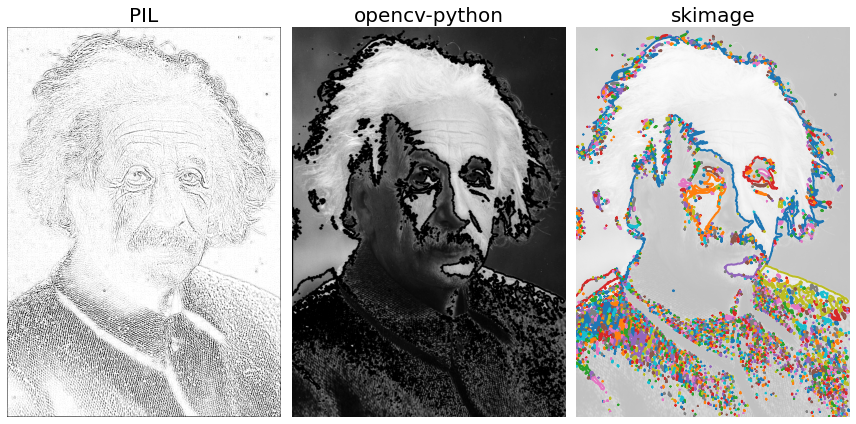

In [31]:
im = Image.open("images/einstein.jpg")
im_ctr = im.filter(ImageFilter.CONTOUR)

im = cv2.imread("images/einstein.jpg")
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

_, thresh = cv2.threshold(im_gray, 127, 255, 0)
contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image=im_gray, contours=contours, contourIdx=-1, color=(0, 0, 0), thickness=2, lineType=cv2.LINE_AA)

im = imread("images/einstein.jpg", True) # read the image from disk as a numpy ndarray
im = im / im.max()
contours = measure.find_contours(im, 0.5) #, fully_connected="high")

plt.figure(figsize=(12,6))
plt.gray()
plt.subplot(131), plt.imshow(im_ctr, aspect='auto'), plt.axis('off'), plt.title('PIL', size=20)
plt.subplot(132), plt.imshow(im_gray, aspect='auto'), plt.axis('off'), plt.title('opencv-python', size=20)
plt.subplot(133), plt.imshow(im, aspect='auto', alpha=0.25), plt.axis('off'), plt.title('skimage', size=20)
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)
plt.tight_layout()
plt.show()

### Applying Instagram-like Filters with `pilgram`

In [ ]:
#!pip install pilgram
import pilgram
# dir(pilgram)
from PIL import Image
from inspect import getmembers, isfunction
import matplotlib.pylab as plt

im = Image.open('images/monalisa.jpg')
effects = {'original': im}
for f in getmembers(pilgram, isfunction):
    effects[f[0]] = f[-1](im)

plt.figure(figsize=(11,15))
plt.subplots_adjust(0,0,1,0.95,0.1,0.05)
i = 1
for e, im in effects.items():
    print(e)
    plt.subplot(5,6,i), plt.imshow(im), plt.axis('off'), plt.title(e, size=15)
    i += 1
plt.show()

### with `pilgram.css` module

The `pilgram` library recreates Instagram filters using Python, following the same image-processing techniques as CSS filters. While CSS filters are applied in web browsers, pilgram applies them programmatically in Python using `PIL` (`Pillow`). The next code snippet applies five CSS-style filters (contrast, grayscale, hue_rotate, saturate, and sepia) from `pilgram.css` to an image and displays them side by side using Matplotlib.

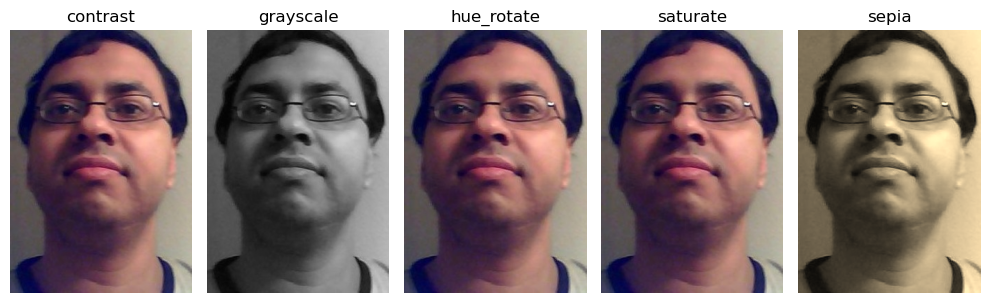

In [17]:
import pilgram.css
im = Image.open('images/me.png')

i = 1
plt.figure(figsize=(10,5))
for f in ['contrast', 'grayscale', 'hue_rotate', 'saturate', 'sepia']:
    func = getattr(pilgram.css, f)
    plt.subplot(1,5,i), plt.imshow(func(im)), plt.axis('off'), plt.title(f, size=12)
    i += 1
plt.tight_layout()
plt.show()

In [ ]:
import pilgram.css.blending

backdrop = Image.open('images/metro.jpg')
source = Image.open('images/dino.jpg')

blendings = {}
for f in getmembers(pilgram.css.blending, isfunction):
    try:
        blendings[f[0]] = f[-1](backdrop, source)
    except:
        continue
        
plt.figure(figsize=(12,7))
plt.subplots_adjust(0,0,1,0.95,0.1,0.05)
i = 1
for e, im in blendings.items():
    plt.subplot(3,4,i), plt.imshow(im), plt.axis('off'), plt.title(e, size=15)
    i += 1
plt.show()

## Questions

### Question 1: Inline Animation 

Create an inline animation in jupyter notebook using the function `matplotlib.animation.FuncAnimation()` . It
takes a function (the update function) that is called at each frame to update the content of the plot, and it generates an animation by repeatedly calling this function. Start with the parrot image and apply the swirl transform with varying values of the parameters. Save the animaion as an animated GIF file. You should obtain an animation as shown below.

![](images/parrot_swirl.gif)

**Hint**

Save the animation to a video (use the function `animation.FFMpegWriter()` and `animation.save()`). You need to have *FFmpeg* installed on your system for Matplotlib to use the `animation.FFMpegWriter`. You can download *FFmpeg* from the official website (<https://ffmpeg.org/download.html>). Ensure that the *FFmpeg* executable is in your system \'s PATH . This allows `matplotlib` to locate and use the FFmpeg binary for video encoding. an will be be able to use `animation.FFMpegWriter` to save your animations as video files. You can optionally save the animation to an animated GIF file, too.

### Question 2: Swirl and Wave transform with `scikit-image` 

Use `scikit-image` \'s `warp()` function to implement the **swirl** and the **wave** transform. Note that swirl transform can
also be expressed with the following equations:

> ![A math equations with numbers AI-generated content may be
> incorrect.](./images/swirl.png)

and the wave transform (to simulate veritical rippling effect) can be expressed using the following equations:

$$\begin{array}
xx(u,v) &= u + 20.\sin\left( \frac{2\pi v}{64} \right)\\
y(u,v) &= v
\end{array}$$

**Note**: The ripping effect displaces each pixel vertically based on its horizontal position $u$. In order to visualize the rippling effect, you need to use **phase**. In a sine wave $sin(θ)=Asin(\frac{2πv}{P}+ϕ)$, the phase $ϕ$ shifts the entire wave  along the $v$-axis.Changing $ϕ$ dynamically (over frames) makes the wave appear to move — much like an ocean wave moving to the right.

Modify the above equation to implement horizontal and 2D rippling effects. You should obtain an animation like the following one:

|![alt](images/lena_wave_vert.gif) |![alt](images/lena_wave_horz.gif)| ![alt](images/lena_wave_2d.gif)|
|-|-|-|


### Question 3: Implement a Liquify Animation with Warping Fields

Implement an image liquify effect using displacement fields and create a smooth animation in Python. Simulate the **liquify** effect—a popular image manipulation technique used in photo retouching tools like Adobe Photoshop—by warping an image using displacement vectors. The effect will be animated to smoothly transition over time.

Given:

- An input image (e.g., a face).
- A source point $(x_0,y_0)$ on the image.
- A target point $(x_1,y_1)$ to which the source point should move.
- A radius of influence $R$ over which the displacement affects neighboring pixels.

Your task is to:

- Implement a function that computes a displacement field centered around $(x_0,y_0)$ and applies it to the image.
- Animate the liquify effect over time using a series of frames interpolating between the original and final positions.
- Save the result as a `.gif` animation.

📐 **Mathematical Background**:
The liquify effect is modeled by a displacement vector: $\vec{d}=\begin{bmatrix}x_1 & −x_0 \\ y_1 & −y_0 \end{bmatrix}$.
For each pixel at position $(x,y)$, we compute its distance from the source point: $r=(x−x_0)^2+(y−y_0)^2$. We define an influence function (or falloff function) $α(r)$ that decays with distance:

$ α(r)= \begin{cases} 
      (1−\frac{r}{R})^2 & \text{if r<R} \\
      0 & \text{otherwise} 
   \end{cases}$

The pixel is displaced as: $(x′,y′)=(x−α(r)⋅dx,y−α(r)⋅dy)$ This remapping is performed using bilinear interpolation.

🧪 Tasks:
- Load and display an input image using OpenCV and Matplotlib.
- Implement the `liquify()` function using the above formula.
- Create a smooth animation by incrementally interpolating the target point $(x_1,y_1)$ over $N$ frames.
- Save the output as an animated `.gif`.
       
You should obtain an animation like the following:
       
![](images/liquify_animation.gif)

💡 **Hints**:

- Use `np.meshgrid()` to create coordinate matrices for the image.
- Use `cv2.remap()` for displacement-based warping (instead of `skimage.transform.warp()`, compare them).
- Use `matplotlib.animation.FuncAnimation` to build the animation.
- To save GIFs, use `writer="pillow"`.


### Question 4: CMYK to RGB 

Write efficient `Python` functions (use `np.dot()`)

-   to convert an image from `CMYK` to `RGB` color space
-   convert a png image to a transparent png image


### Question 5: Creating a Side-by-Side Zoom Animation

Write a Python program to create an animated side-by-side zoom-in and zoom-out effect from a given input image. The goal is to visualize how digital zooming operations can be animated to reveal different levels of detail in an image over time.

🌟 **Objective**: Write Python code that takes an input image and generates an animation (as a GIF or video) that shows:
- On the left side, a smooth zoom-out effect from the center of the image.
- On the right side, a simultaneous smooth zoom-in effect toward the center of the image.
- These effects should be synchronized and reversed to create a looping animation.

Let $(W,H)$ be the width and height of the image. Let $(x_c,y_c)$ be the image center. To perform zooming:

- Define a scale factor $s > 1$ to zoom in (crop center), or $s < 1$ to zoom out (pad or interpolate).
- Compute new region width and height: $W^{\prime}=\frac{W}{s}$, $H^{\prime}=\frac{H}{s}$.
- Extract the subregion centered at $(x_c, y_c)$, and resize back to $(W,H)$ to maintain original dimensions.
- Use linear interpolation when resizing for smooth quality.

Here are the detailed steps:

- Read an input image (e.g., with `cv2.imread()`).
- Generate frames using a loop over a range of **zoom scales** (e.g., from $1.0$ to $2.0$).
- Create a frame by placing zoom-out and zoom-in versions side-by-side.
- Save the resulting animation as a GIF or video using imageio or cv2.VideoWriter.

📌 **Constraints**:
- You should use only standard packages: cv2, numpy, and imageio.
- Make sure the final animation loops smoothly (zoom-out → zoom-in → zoom-out).
- Image resolution must remain constant across all frames.
- Allow adjusting zoom speed (step size) and output frame rate.

✅ **Expected Outcome**:

You should be able to generate a file like the following one (starting with an image of a squirrel)

![](images/zoom_in_out.gif)

that visualizes synchronized zoom-in and zoom-out animations side-by-side from any input image.


### Question 6: Facebook-Style Shake / Vibration Effect with `opencv-python`

Simulate a visual feedback effect commonly used in social media platforms like Facebook—where an image first undergoes a strong initial shake, followed by a subtle vibration animation. This effect is often used to grab attention for user interactions like story highlights, emoji reactions, or animated profile frames. Write a Python program to:

Load a color image of your choice (e.g., a profile picture).

Create an animation that consists of two sequential phases:

- Initial Shake Phase (e.g., first $10$ frames):
- Apply strong random displacements to the image (e.g., shifts of $±10$ pixels).
- Vibration Phase (remaining $50$ frames):
- Apply smaller, jittery displacements (e.g., ±3 pixels) that make the image appear to vibrate in place.
- Use affine transformations (translation matrices) to implement the shake/vibration.
- Animate the effect using matplotlib.animation.FuncAnimation.
- Display the animation in Jupyter Notebook or save it as a `.gif` or `.mp4` file.

**Hints**:

- Use `cv2.warpAffine()` to apply translations to the image using a transformation matrix.
- To simulate random shifts, use `np.random.randint()` for generating displacement values.
- Use two distinct ranges for displacement: a larger one for the initial shake (e.g., $±10$) and a smaller one for vibration (e.g., $±3$).
- Use `FuncAnimation` from `matplotlib.animation` to render the sequence over time.

You should obtain an animation like the following one:

![](images/me_ms_fb_shake.gif)

### Question 7: Rotating Textured Cube with Animated GIF Output

Create a rotating 3D cube using **OpenGL** and Python. Each face of the cube should be textured with a distinct image loaded from a user-specified folder. The final output should be saved as an animated GIF, visually demonstrating basic texture mapping and real-time rendering concepts. Here are the instructions you should follow:

* Image Preparation: Start with a folder named `cube` containing six square images named 1.jpg, 2.jpg, ..., 6.jpg. These images will be mapped to the cube faces in the following order:

    - 1.jpg → bottom face
    - 2.jpg → top face
    - 3.jpg → front face
    - 4.jpg → back face
    - 5.jpg → left face
    - 6.jpg → right face

* Rendering Requirements: Use the `pyglet` library to create an off-screen `OpenGL` context. Define the cube geometry and texture coordinates. Resize and load each image as an `OpenGL` texture using `PIL`. Apply correct transformations to create a 3D perspective view. Rotate the cube around two axes for a full 360° view over multiple frames.

* Animation Output: Capture at least 60 frames of the rotating cube from different angles. Use the `Pillow` (`PIL`) library to save the captured frames as an animated GIF. Name the final output file `rotating_cube.gif`.

💡 Hints:
- Use `pyglet.window.Window(visible=False)` to create a hidden rendering window.
- Use `glFrustum` or `gluPerspective` to set up the perspective projection.
- Remember to flip the rendered image vertically before saving with `PIL`, since `OpenGL` origin is *bottom-left*.
- To apply textures correctly, use `glTexCoord2f` with appropriate vertex order.

📝 Note
- `OpenGL` (Open Graphics Library) is a cross-platform, low-level API used for rendering 2D and 3D graphics, offering developers direct control over the graphics pipeline. 
- `Pyglet` is a lightweight, pure-Python library that provides windowing, event handling, and media playback, while giving seamless access to OpenGL. 
- Together, they allow Python users to create real-time visualizations, interactive graphics, and texture-mapped 3D objects with minimal setup. 
- Pyglet simplifies OpenGL integration by handling context creation and display loops, making it especially useful for learning, experimentation, and image processing. 
- This combination enables powerful GPU-accelerated rendering workflows entirely within Python.
- A texture is a 2D image mapped onto the surface of a 3D object to add color, detail, or realism during rendering.

With **standard test images** (**Lena**, **Mandrill**, **Cameraman**, **Pepper** etc.) in image processing as textures, you should obtain an animation like the following one:

![](images/rotating_cube.gif)

### Question 8: Embedding a Movie Trailer into a Film Reel

In this exercise, you will build a dynamic visual storytelling effect by embedding a rolling sequence of frames from a movie trailer into the four frames of a film reel image.

You are given:

- A video file (e.g., Lion King movie trailer `lionking.mp4`).
- A static image of a film reel (e.g., `reel.jpg`) with empty frames marked on it.
- A predefined list of perspective coordinates indicating where each of the four trailer frames should be mapped inside the reel image.

Video | Reels Image
- | - 
![](images/lionking.gif) | ![](images/reel.jpg)
    
Each time a new frame is processed from the trailer, the most recent four frames will be perspective-transformed and embedded into the four reel positions. This simulates a rotating sequence as the trailer progresses.

Finally, all processed frames will be compiled into an animated GIF showing the trailer playing across the film reel.

Your Task:

- Implement and complete the Python script that does the following:
- Loads the reel image and the trailer video.
- Extracts every 5th frame from the trailer to reduce frame count.
- Maintains a rolling buffer of the latest 4 frames.
- For each group of 4 frames:
  - Applies a perspective warp to embed each frame into the corresponding region on the reel using the provided coordinates.
  - Blends the reel and the warped trailer frames using a weighted average to simulate realistic overlaying.
  - Stores the output as a frame for GIF creation.
  - After processing the video, generates an animated GIF (movie.gif) from the output images.

**Predefined Output Coordinates** for the Reel Frames:

`output_coords = [`

`np.float32([[205, 450], [315, 488], [330, 404], [230, 370]]),`
    
`np.float32([[232, 354], [331, 390], [338, 320], [248, 291]]),`

`np.float32([[250, 277], [338, 308], [339, 255], [259, 229]]),`

`np.float32([[260, 219], [338, 245], [334, 205], [263, 183]])`

`]`

You should obtain as animation like the following:

![](images/movie.gif)